## Load data into AnnData object

In [21]:
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
import scvi
import torch


In [4]:
adata = ad.read_h5ad('../../Data/batch_integration_1-3_cd4_t_subset_batch1.h5ad')

In [5]:
sc.set_figure_params(dpi=50, facecolor="white") 


In [6]:
print(adata.obs["pica_id"].value_counts())
adata

pica_id
PICA0001    2407
PICA0007    1879
PICA0006    1633
PICA0003    1216
PICA0004    1214
PICA0002    1022
PICA0005     688
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_

## Define Mt, Rb, Hb genes and Calculate QC metrics

## Visualize QC metrics

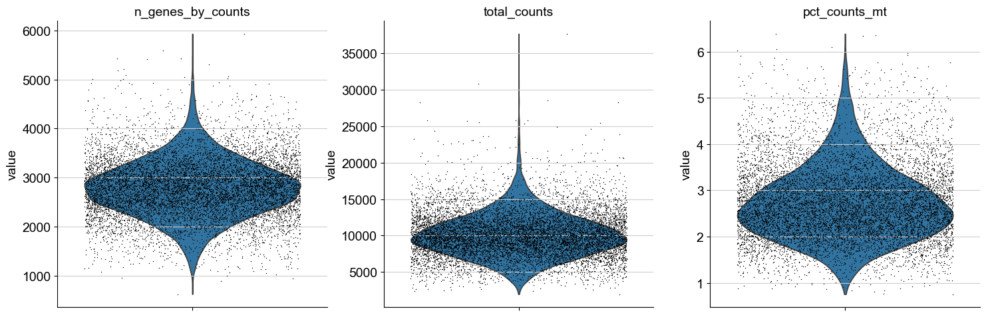

In [7]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

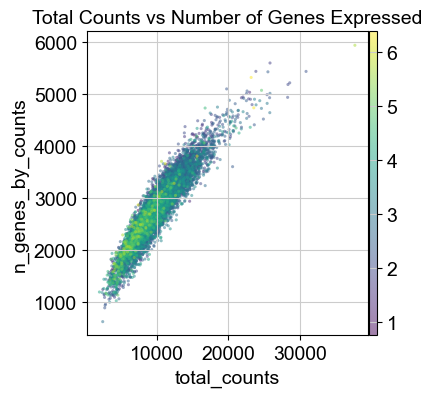

In [8]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt', title='Total Counts vs Number of Genes Expressed', alpha=0.5, size=20)

## Filter to keep good quality cells/genes if needed
Remove cells with less than 100 genes and remove genes not present in more than 3 cells
Remove cells that has more than 5% of mt expression

## Doublet detection
Scrublet
output: doublet_score and predicted_doublet in .obs
Use score during clustering to filter clusters with high doublet scores

## Normalization

In [9]:
adata.layers['counts'] = adata.X.copy()  # Store raw counts in a separate layer

In [10]:
sc.pp.normalize_total(adata)  # default count to 1e4
sc.pp.log1p(adata)

## Feature selection
Reduce dimensionality of dataset to only include informative genes

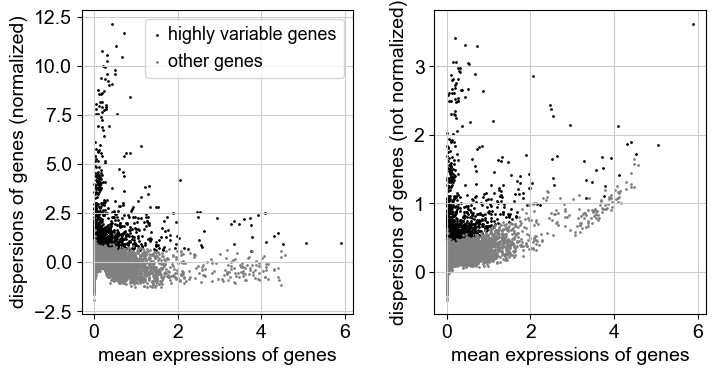

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key='pica_id')
sc.pl.highly_variable_genes(adata)

In [12]:
print(adata.var.highly_variable.sum())


2000


## Dimensionality reduction
How many PCs to consider to compute neighbourhood relation of cells
Used in clustering function leiden()

In [13]:
sc.tl.pca(adata)

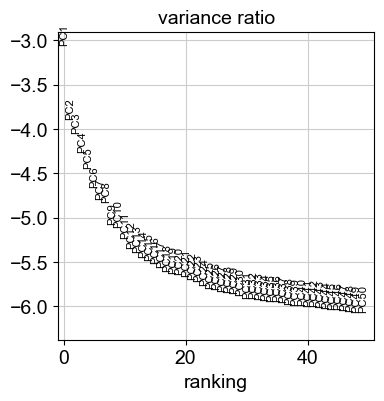

In [14]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

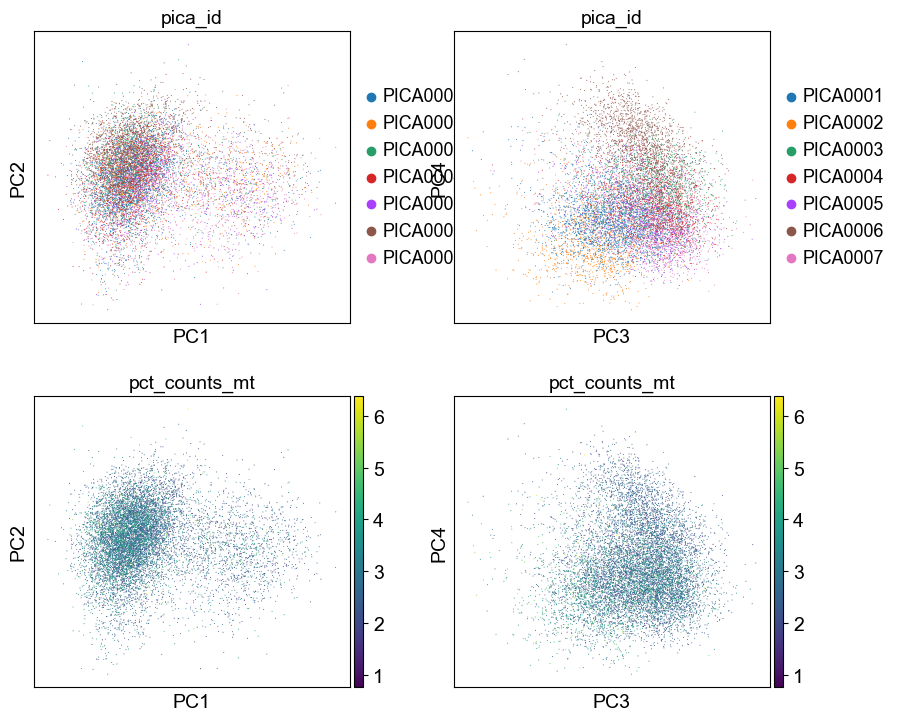

In [15]:
# Check PCA results for undesired technical artifacts like batch effects or mitochondrial stress
sc.pl.pca(
    adata,
    color=["pica_id", "pica_id", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

## Nearest neighbour graph construction and visualization
using PCA results

In [16]:
sc.pp.neighbors(adata)

In [17]:
sc.tl.umap(adata)

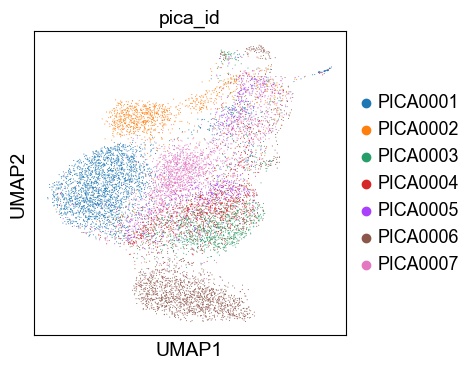

In [18]:
sc.pl.umap(
    adata,
    color="pica_id",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

## Clustering
Leiden graph-clustering method (community detection based on optimizing modularit) like in Seurat

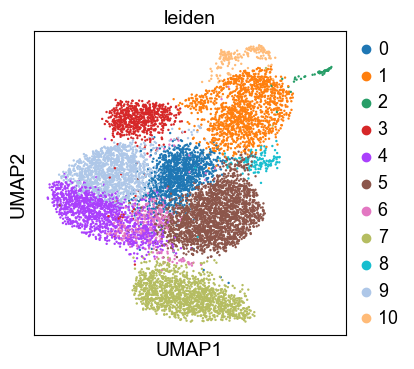

In [19]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.pl.umap(adata, color=["leiden"])

saving figure to file /Users/jessica/Documents/GitHub/Jessica_notebooks/figures/umapbatch1_leiden_pica_id_umap.png


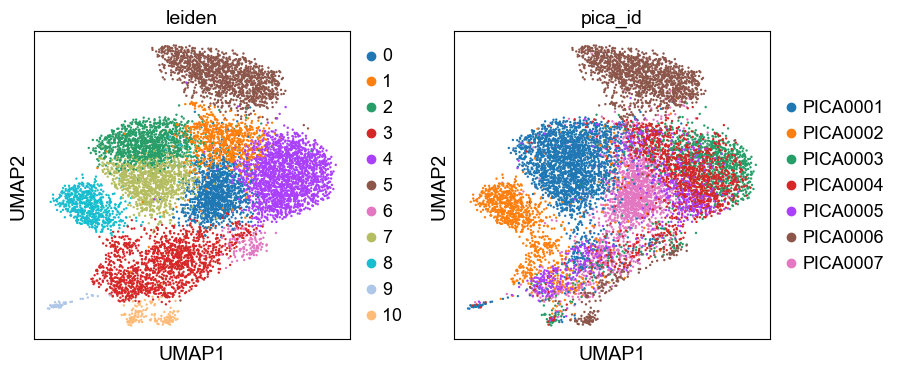

In [27]:
sc.pl.umap(adata, color = ['leiden','pica_id'], save='batch1_leiden_pica_id_umap.png')

Batch integration?

In [26]:
# 1. Make a fresh copy of your raw data (optional, but safe)
adata_uncorrected = adata.copy()

# 2. Ensure raw counts are stored
adata.raw = adata

# 3. Set up for scvi — register the AnnData object
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="pica_id")

# 4. Train the scVI model
model = scvi.model.SCVI(adata)
model.train()

# 5. Get latent representation (batch-corrected)
adata.obsm["X_scVI"] = model.get_latents()

# 6. Use latent representation for downstream steps
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)
sc.tl.leiden(adata)

# 7. Plot integrated UMAP
sc.pl.umap(adata, color=["leiden", "pica_id"], save="scvi_integrated_umap.png")


/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/scvi/train/_trainrunner.py:69: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  accelerator, lightning_devices, device = parse_device_args(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `D

Epoch 400/400: 100%|██████████| 400/400 [5:44:00<00:00, 41.03s/it, v_num=1, train_loss_step=7.84e+3, train_loss_epoch=7.76e+3]   

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [5:44:00<00:00, 51.60s/it, v_num=1, train_loss_step=7.84e+3, train_loss_epoch=7.76e+3]


AttributeError: 'SCVI' object has no attribute 'get_latents'

2025-09-01 02:13:42,226 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-09-01 02:13:43,358 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-01 02:13:43,515 - harmonypy - INFO - Iteration 1 of 10
2025-09-01 02:13:44,813 - harmonypy - INFO - Iteration 2 of 10
2025-09-01 02:13:46,080 - harmonypy - INFO - Iteration 3 of 10
2025-09-01 02:13:47,281 - harmonypy - INFO - Converged after 3 iterations
/var/folders/xb/gpl6jzb15493fwndpjblxyc40000gn/T/ipykernel_85053/3916616472.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


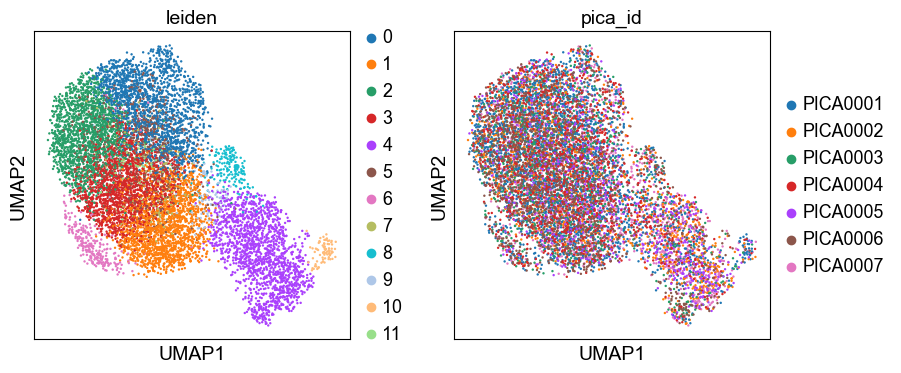

In [29]:

adata_uncorrected = adata.copy()

sce.pp.harmony_integrate(adata, key='pica_id')

sc.pp.neighbors(adata, use_rep='X_pca_harmony')
sc.tl.umap(adata)  
sc.tl.leiden(adata)

sc.pl.umap(adata, color = ['leiden','pica_id'], save='batch1_leiden_pica_id_IntegratedUmap.png')

In [30]:

sc.tl.paga(adata, groups='leiden')

pd.crosstab(adata.obs['pica_id'], adata.obs['leiden'], normalize= 'index')

leiden,0,1,2,3,4,5,6,7,8,9,10,11
pica_id,,,,,,,,,,,,
PICA0001,0.221853,0.156211,0.201496,0.155380,0.086415,0.077690,0.026174,0.026174,0.011217,0.017034,0.014541,0.005816
PICA0002,0.171233,0.115460,0.148728,0.136008,0.301370,0.052838,0.010763,0.013699,0.016634,0.018591,0.007828,0.006849
PICA0003,0.181743,0.173520,0.187500,0.184211,0.097862,0.084704,0.031250,0.018092,0.023026,0.008224,0.004934,0.004934
PICA0004,0.189456,0.172158,0.139209,0.196870,0.117792,0.073311,0.036244,0.024712,0.018122,0.019769,0.004119,0.008237
PICA0005,0.159884,0.178779,0.100291,0.122093,0.324128,0.049419,0.011628,0.018895,0.004360,0.013081,0.011628,0.005814
PICA0006,0.145744,0.180037,0.211880,0.189222,0.102878,0.073484,0.039192,0.017146,0.025720,0.002449,0.002449,0.009798
PICA0007,0.152741,0.191591,0.123470,0.151144,0.217137,0.074508,0.019159,0.026078,0.019691,0.012241,0.006386,0.005854


## Re-assess qc and cell filtering

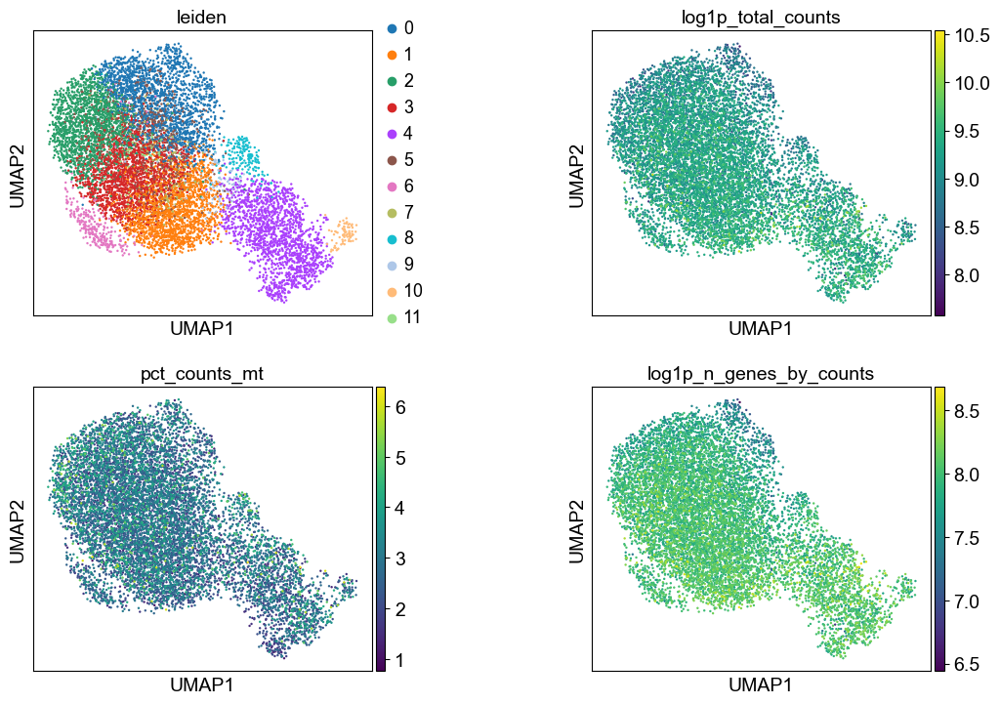

In [31]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

## Annotation

### Optimising Clustering
different resolutions

In [32]:
# Test different resolutions for Leiden clustering
# Higher resolution will result in more clusters, lower resolution will result in fewer clusters
for res in [0.02, 0.5, 1.0, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

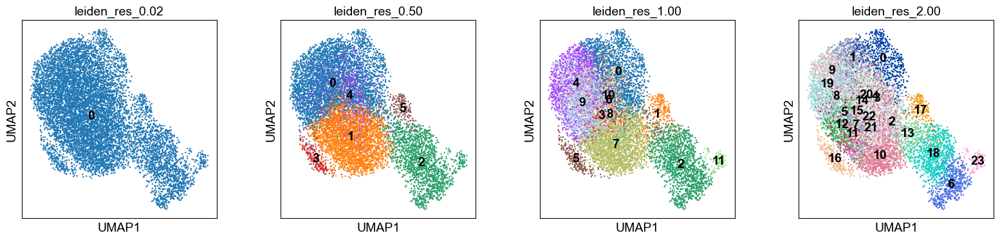

In [33]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

Plot known marker genes to see if they align with your clusters
Cluster sizes

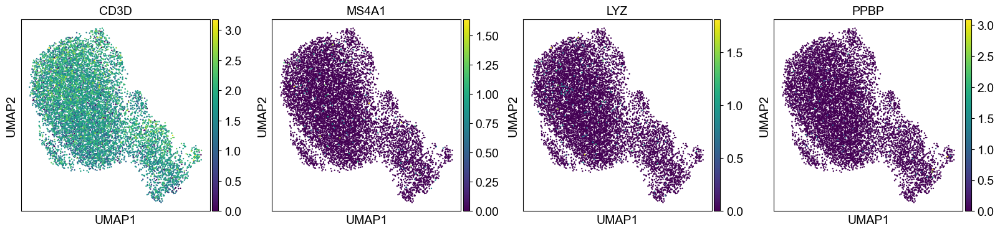

leiden
0     1795
1     1691
2     1681
3     1653
4     1577
5      727
6      264
7      219
8      176
9      130
10      78
11      68
Name: count, dtype: int64

In [34]:
sc.pl.umap(adata, color=["CD3D", "MS4A1", "LYZ", "PPBP"])  # example for T-cells, B-cells, monocytes, platelets
adata.obs["leiden"].value_counts()      # Check cluster sizes




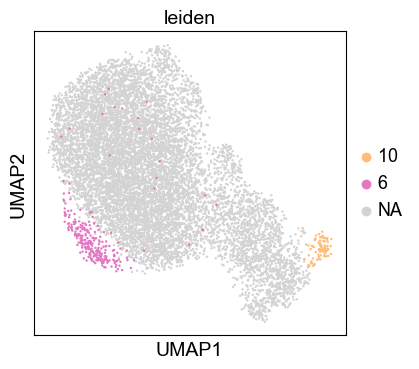

In [35]:
sc.pl.umap(adata, color='leiden', groups=['6', '10'])


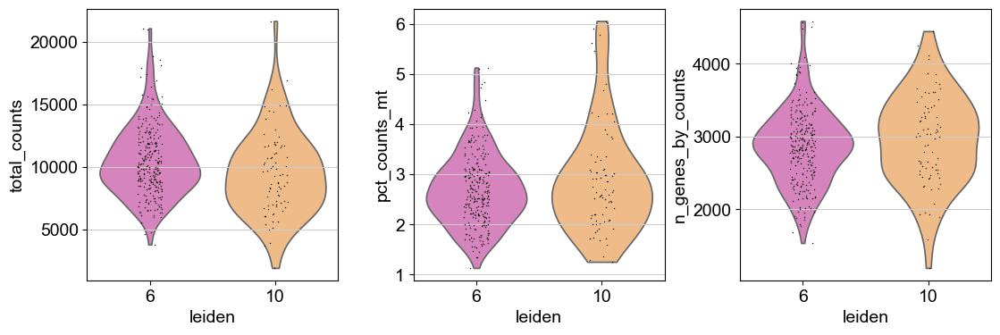

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

adata_sub = adata[adata.obs['leiden'].isin(['6', '10'])].copy()

# Violin plots for total counts, mito%, n_genes for clusters 6 and 10
sc.pl.violin(adata_sub, ['total_counts', 'pct_counts_mt', 'n_genes_by_counts'],
             groupby='leiden', multi_panel=True)

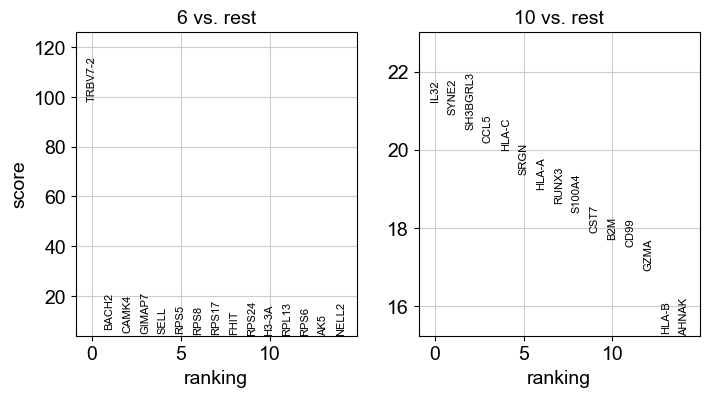

In [37]:
sc.tl.rank_genes_groups(adata, groupby='leiden', groups=['6', '10'], method='t-test')
sc.pl.rank_genes_groups(adata, groups=['6', '10'], n_genes=15, sharey=False, save='batch1_leiden_6_10_rank_genes.png')


## Marker gene list

In [38]:
import pandas as pd

# CD4 helper program (not Tfh-specific)
cd4_helper = ["IL7R","CCR7","TCF7","LEF1","SELL"]
# CD8 / cytotoxic program
cd8_cyto   = ["CD8A","CD8B","NKG7","GNLY","PRF1","GZMB"]
# MAIT markers
mait_genes = ["KLRB1","SLC4A10","IL7R","TRAV1-2","DPP4"]  # TRAV1-2 if present in your matrix
# gamma-delta T markers (often TRGV/TRDV not in RNA matrix; use proxies)
gdt_genes  = ["TRDC","TRGC1","TRGC2","KLRD1","NKG7"]

for n, g in {
    "score_cd4_helper": cd4_helper,
    "score_cd8_cyto":   cd8_cyto,
    "score_mait":       mait_genes,
    "score_gdt":        gdt_genes,
}.items():
    sc.tl.score_genes(adata, g, score_name=n)

In [39]:
is_cd4 = (adata.obs["score_cd4_helper"] > 0.2) & (adata.obs["score_cd8_cyto"] < 0.1)
is_cd8 = (adata.obs["score_cd8_cyto"]   > 0.2) & (adata.obs["score_cd4_helper"] < 0.1)

adata.obs["T_lineage"] = "T_other"
adata.obs.loc[is_cd4, "T_lineage"] = "CD4"
adata.obs.loc[is_cd8, "T_lineage"] = "CD8"

# Optional flags (don’t force into lineage, just annotate)
adata.obs["is_MAIT"] = adata.obs["score_mait"] > 0.3
adata.obs["is_gdT"]  = adata.obs["score_gdt"]  > 0.3

In [41]:
# Define marker genes for T cell subsets
tfh_panel = {
    "tfh_pos": [
        "CXCR5",
        "PDCD1",      # PD-1
        "ICOS",
        "BCL6",
        "IL21",
        "TOX2",
        "MAF",
        "CXCL13",
        "SH2D1A",     # SAP
        "BATF",
        "TNFRSF4",    # OX40
    ],
    "tfh_neg": ["PRDM1","NKG7","GNLY","GZMB"],

    "tfh1":   ["CXCR3","TBX21","IFNG"],
    "tfh2":   ["GATA3","IL4","IL5","IL13"],
    "tfh17":  ["CCR6","RORC","IL17A","IL17F"],
    "gc_tfh": ["CXCL13","PDCD1","BCL6","ICOS"],   # expect high/hi
    "mem_tfh":["CCR7","TCF7","LEF1"],             # expect high/hi

    "tfr":    ["FOXP3","IL2RA","CTLA4","IKZF2","CXCR5"]
}

In [42]:
cd4 = adata[adata.obs["T_lineage"] == "CD4"].copy()

sc.tl.score_genes(cd4, tfh_panel["tfh_pos"], score_name="score_tfh_pos")
sc.tl.score_genes(cd4, tfh_panel["tfh_neg"], score_name="score_tfh_neg")

# Tfh core (tune thresholds on your data)
cd4.obs["is_tfh_core"] = (cd4.obs["score_tfh_pos"] - cd4.obs["score_tfh_neg"] > 0.3)

# Subset scores
for nm in ["tfh1","tfh2","tfh17","gc_tfh","mem_tfh","tfr"]:
    sc.tl.score_genes(cd4, tfh_panel[nm], score_name=f"score_{nm}")

def call_tfh(row):
    if not row["is_tfh_core"]:
        return "CD4_nonTfh"
    if row["score_tfr"] > 0.3:
        return "Tfr"
    subs = {k: row[k] for k in ["score_tfh1","score_tfh2","score_tfh17","score_gc_tfh","score_mem_tfh"]}
    return {"score_tfh1":"Tfh1","score_tfh2":"Tfh2","score_tfh17":"Tfh17",
            "score_gc_tfh":"GC-Tfh","score_mem_tfh":"Memory-like Tfh"}[max(subs, key=subs.get)]

cd4.obs["tfh_subset"] = cd4.obs.apply(call_tfh, axis=1)

In [43]:
adata.obs["tfh_subset"] = "non_CD4"
adata.obs["is_tfh_core"] = False
adata.obs.loc[cd4.obs_names, "tfh_subset"]  = cd4.obs["tfh_subset"].values
adata.obs.loc[cd4.obs_names, "is_tfh_core"] = cd4.obs["is_tfh_core"].values

def final_label(row):
    # prioritize specific Tfh calls inside CD4
    if row["tfh_subset"] in {"Tfh1","Tfh2","Tfh17","GC-Tfh","Memory-like Tfh","Tfr"}:
        return row["tfh_subset"]
    # otherwise keep coarse lineage
    return row["T_lineage"]

adata.obs["final_label"] = adata.obs.apply(final_label, axis=1)


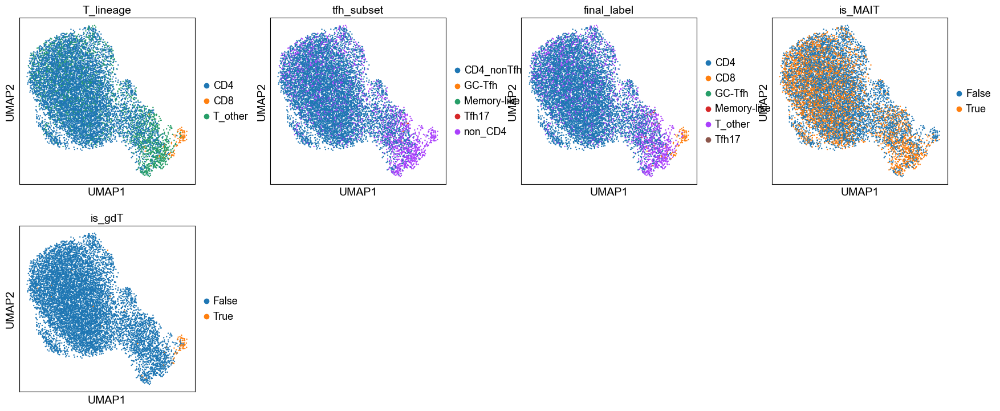

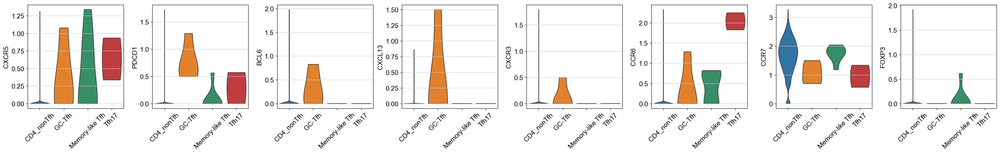

In [44]:
import pandas as pd
pd.crosstab(adata.obs["T_lineage"], adata.obs["tfh_subset"])

# UMAPs to show
sc.pl.umap(adata, color=["T_lineage","tfh_subset","final_label","is_MAIT","is_gdT"], wspace=0.3)

# Violin sanity checks within CD4
sc.pl.violin(adata[adata.obs["T_lineage"]=="CD4"],
             keys=["CXCR5","PDCD1","BCL6","CXCL13","CXCR3","CCR6","CCR7","FOXP3"],
             groupby="tfh_subset", stripplot=False, rotation=45)


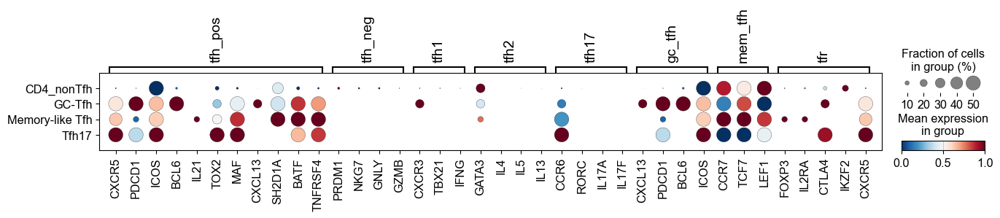

In [49]:
sc.pl.dotplot(
    adata[adata.obs["T_lineage"]=="CD4"],   # restrict to CD4 lineage
    var_names=tfh_panel,
    groupby="tfh_subset",
    standard_scale="var",   # scale each gene to highlight relative expression
    dot_max=0.5,            # max dot size (tune)
    color_map="RdBu_r"      # red/blue diverging
)

In [50]:
lineage_markers = [
    "CD4","IL7R","CCR7","TCF7",         # CD4 helper
    "CD8A","CD8B","NKG7","GZMB","GNLY", # CD8 cytotoxic
    "CXCR5","PDCD1","BCL6","ICOS","CXCL13", # Tfh
    "FOXP3","IL2RA","CTLA4"             # Treg/Tfr
]

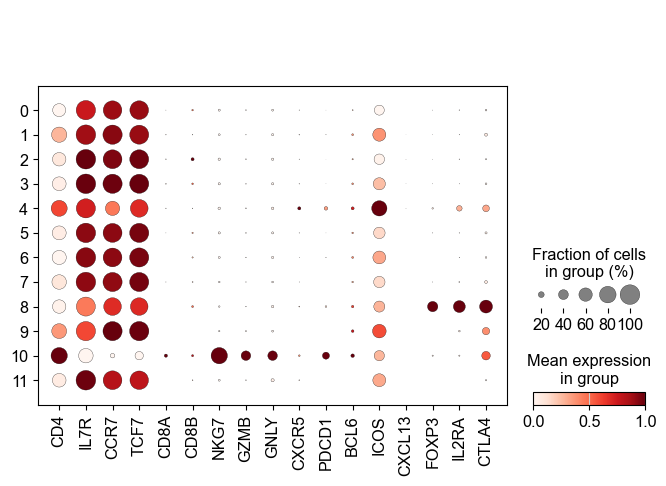

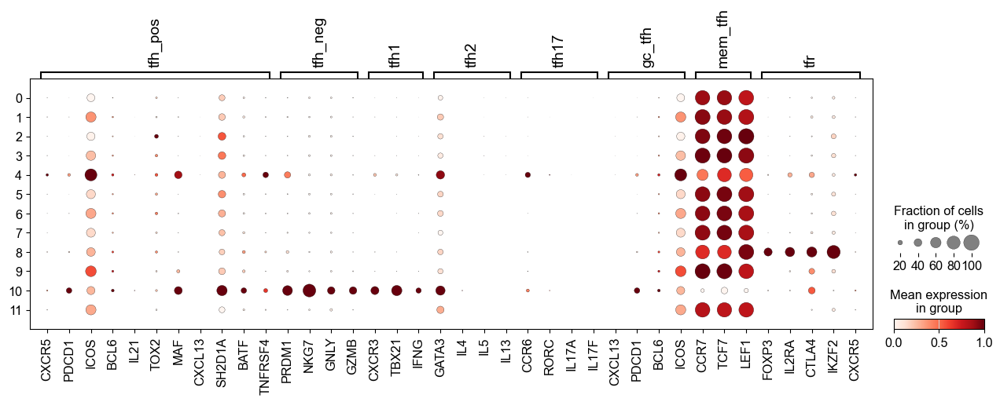

In [52]:
sc.pl.dotplot(adata, var_names=lineage_markers, groupby="leiden", standard_scale="var", save='batch1_tcell_dotplot.png')
sc.pl.dotplot(adata, tfh_panel, groupby="leiden", standard_scale="var", save='batch1_tfh_genes_dotplot.png')


In [ ]:
for subset, genes in adata.obs["cell_type"].items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")


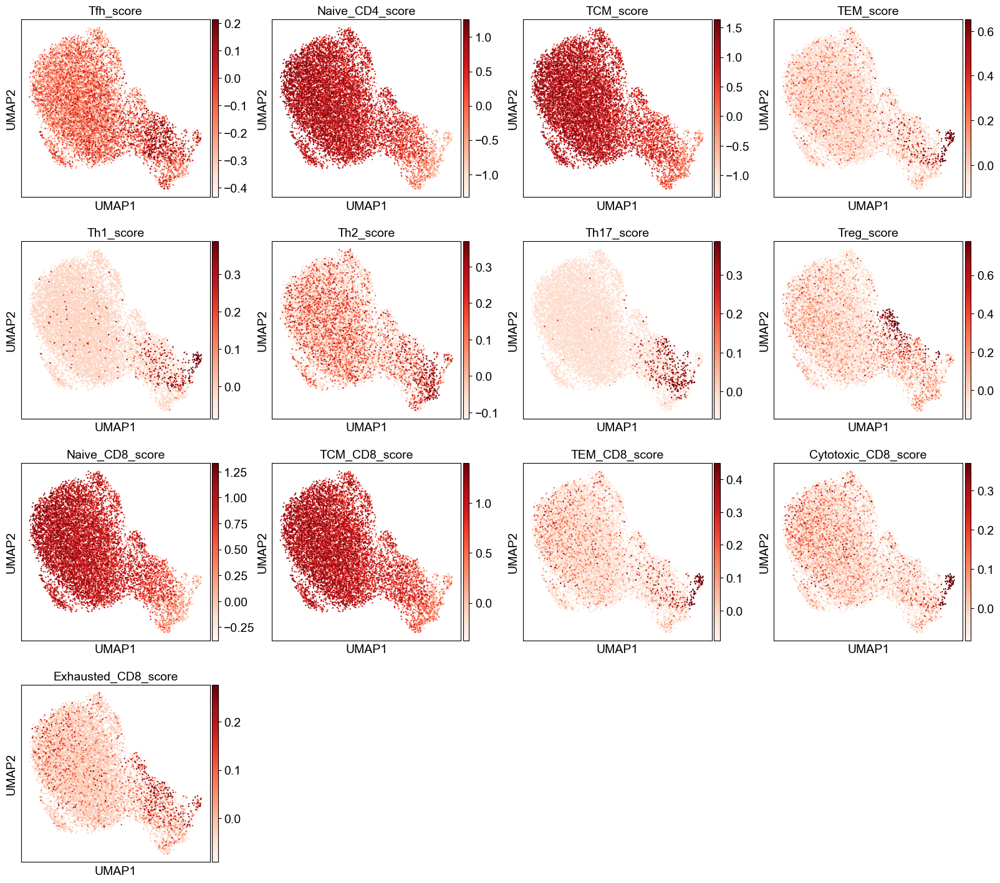

In [68]:
for subset, genes in tcell_markers.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")

sc.pl.umap(adata, color=[f"{subset}_score" for subset in tcell_markers.keys()],
           cmap='Reds', vmax='p99', ncols=4)


saving figure to file figures/umapbatch1_pos_tfh_markers_umap.png


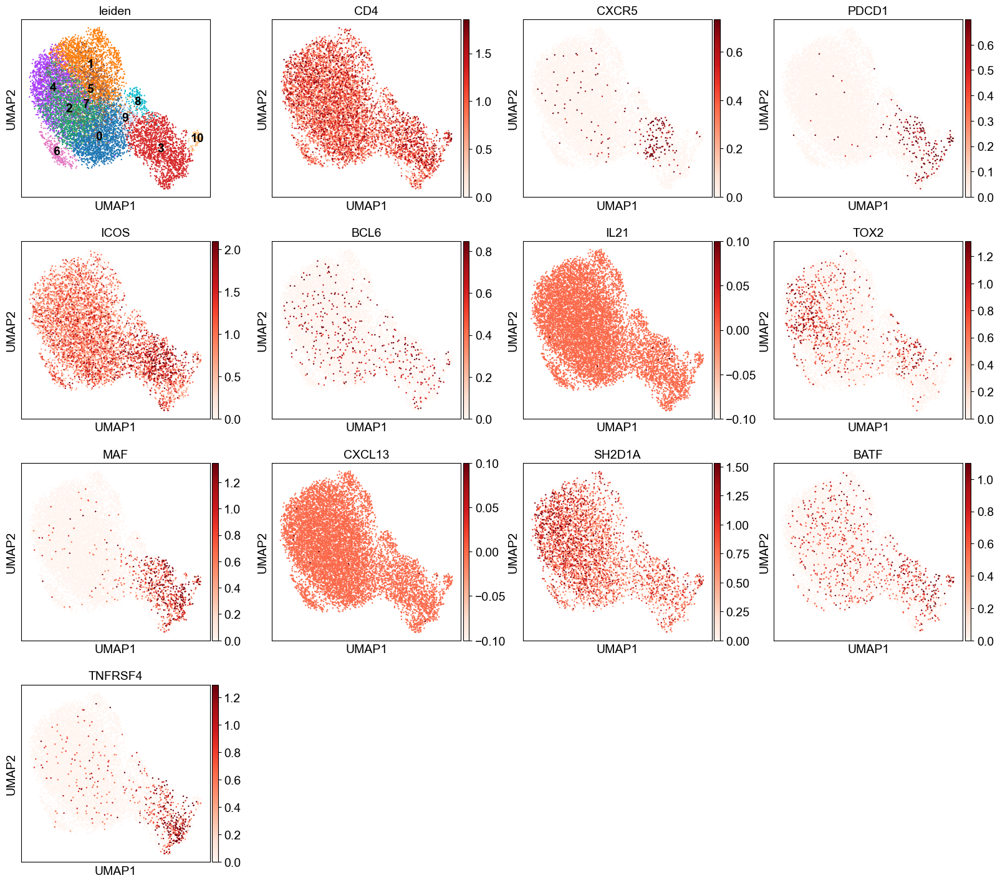

saving figure to file figures/umapbatch1_neg_tfh_markers_umap.png


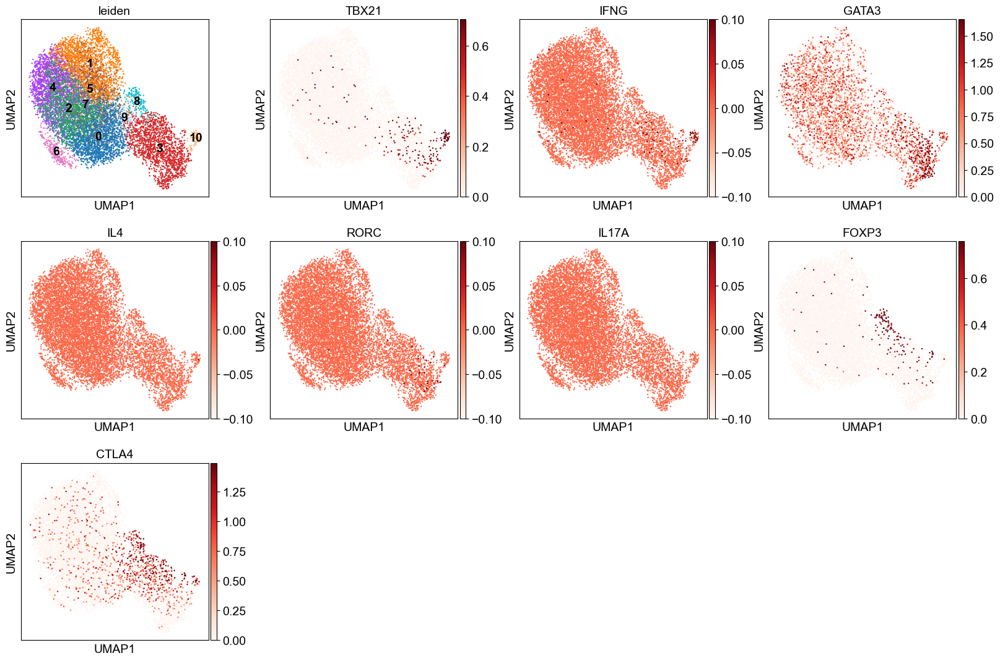

In [73]:


sc.pl.umap(adata, color=['leiden', 'CD4', 'CXCR5', 'PDCD1', 'ICOS', 'BCL6', 'IL21', 'TOX2', 'MAF', 'CXCL13', 'SH2D1A', 'BATF', 'TNFRSF4'], 
           legend_loc= 'on data', 
           cmap= 'Reds',
           vmax = 'p99', 
           save='batch1_pos_tfh_markers_umap.png')

sc.pl.umap(adata, color=['leiden', 'TBX21', 'IFNG', 'GATA3', 'IL4', 'RORC', 'IL17A', 'FOXP3', 'CTLA4'],
           legend_loc= 'on data', 
           cmap= 'Reds', 
           vmax = 'p99', 
           save='batch1_neg_tfh_markers_umap.png')


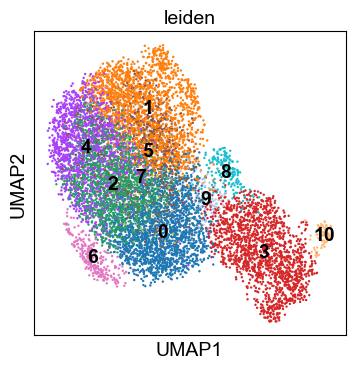

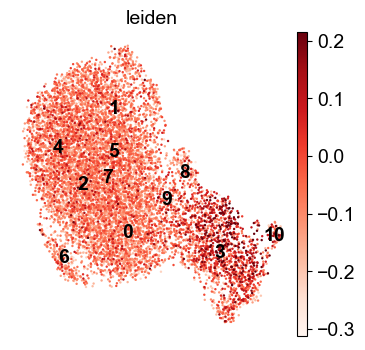

In [ ]:

sc.tl.score_genes(adata, tfh_panel["tfh_pos"], score_name="TFH_score")

sc.pl.umap(
    adata,
    color=['leiden'],
    legend_loc='on data',
    cmap='Reds', vmax='p99'
)

ax = sc.pl.umap(
    adata, color='TFH_score',
    cmap='Reds', vmax='p99',
    frameon=False, show=False
)
# draw the same embedding again, but only to place cluster labels
sc.pl.umap(
    adata, color='leiden',
    legend_loc='on data',  # writes the cluster numbers on the cloud
    size=1.5, alpha=0.0,   # don't add extra points; just labels
    ax=ax, show=False
)
plt.show()

            mean    median  size
leiden                          
10      0.000188 -0.020921    76
3      -0.004042 -0.019038  1563
9      -0.074450 -0.084049    98
8      -0.093401 -0.109207   185
2      -0.097472 -0.102677  1707
1      -0.100852 -0.106512  1870
5      -0.109459 -0.113226   728
6      -0.109707 -0.115655   262
0      -0.110012 -0.112724  1887
4      -0.113539 -0.119295  1461
7      -0.114005 -0.111499   222


/var/folders/xb/gpl6jzb15493fwndpjblxyc40000gn/T/ipykernel_95119/2969961483.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('leiden')['TFH_score']


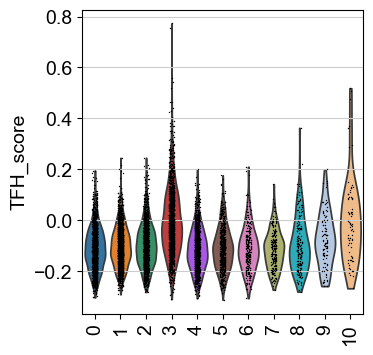

In [39]:
# mean/median TFH_score per Leiden cluster
summary = (
    adata.obs.groupby('leiden')['TFH_score']
    .agg(['mean','median','size'])
    .sort_values('mean', ascending=False)
)
print(summary)

# violin to see TFH_score distribution per cluster
sc.pl.violin(adata, keys='TFH_score', groupby='leiden', rotation=90)

In [32]:
cluster_annotations = {
    '0': 'Naive CD4+ T',
    '1': 'Th1',                
    '2': 'Central Memory',
    '3': 'Tfh',                
    '4': 'Activated T',
    '5': 'Transitional Tfh',
    '6': 'Th2/ILC-like',
    '7': 'Naive/Quiescent',
    '8': 'Th17',
    '9': 'Uncertain',
    '10': 'Treg',
}
adata.obs['celltype'] = adata.obs['leiden'].map(cluster_annotations)


saving figure to file figures/umapbatch1_tfh_annotations_umap.png


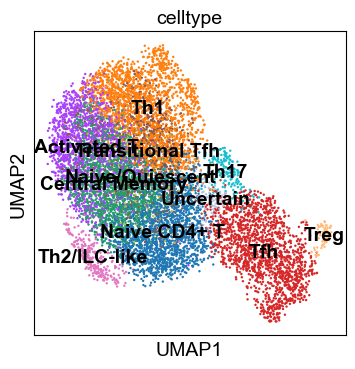

In [33]:
sc.pl.umap(adata, color='celltype', legend_loc='on data', save='batch1_tfh_annotations_umap.png')


## DEGs as Markers

saving figure to file figures/rank_genes_groups_leidenbatch1_leiden_rank_genes.png


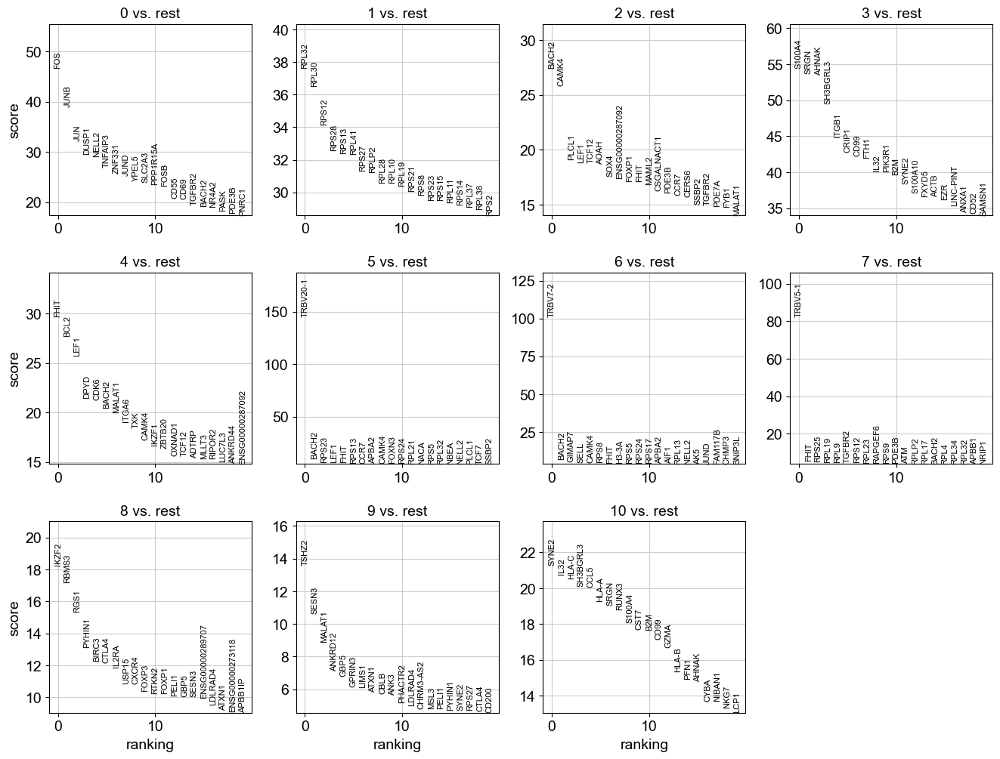

In [34]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, save='batch1_leiden_rank_genes.png')


saving figure to file figures/rank_genes_groups_leidenleiden_rank_genes_batch1_0_1.png


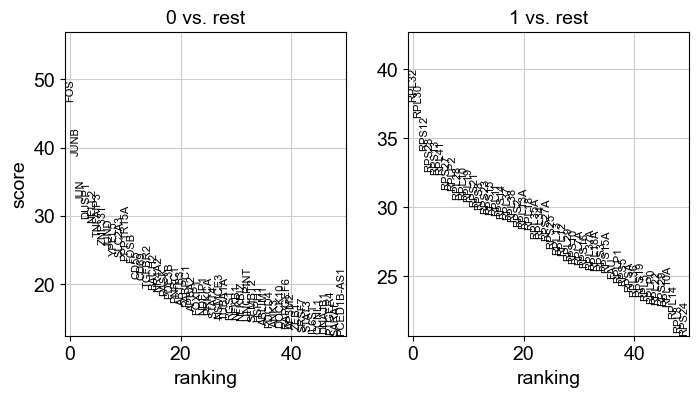

In [35]:
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=False, groups=['0','1'], save='leiden_rank_genes_batch1_0_1.png')

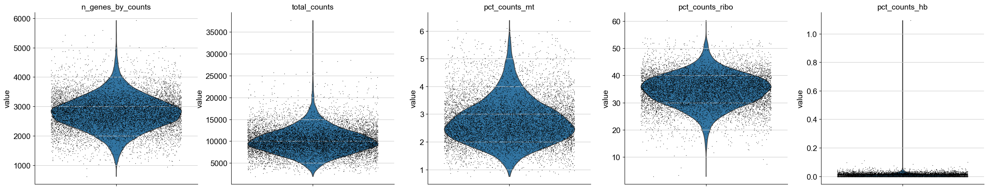

In [36]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'], jitter=0.4, multi_panel=True)

In [37]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_1.0", standard_scale="var")

NameError: name 'marker_genes' is not defined